# Thinking about the classical maps for this problem.

I am looking at the classical maps associated with Justin Wilson's scrambeling paper.

In [123]:
using Revise
import Plots

## Classical chaos map

I'll start be writing a function that implements a single loop of the proposed mapping and then roll that into a loop.  This has a base map that is chaotic and an attractor that are applied stocasticaly.

In [189]:
"""
BaseMap: This function is the base chaotic map with no added structure to switch to regular behavior

the map is applied to an array of target points
"""

function BaseMap(points::Vector{Float64})

    update = points[:]
    for i in 1:length(points)
        update[i] = mod1(2*points[i],1)
    end

    return update
end

"""
Attractor

this is a hard-coded version of the atractor that pulls to 0 and 1
"""

function Attractor(points::Vector{Float64})

    update = points[:]
    for i in 1:length(points)
        update[i] = 0.5 * ( (points[i] > 0.5 ? 1 : 0 ) + points[i] )
    end

    return update
end


"""
BaseMap this version of BaseMap creates a 2D output array following the trajectories of each of the points 
"""
function BaseMap(points::Vector{Float64}, loops::Int64, p::Float64)
    # Allocate output array
    trajectories = Array{Float64}(undef, loops, length(points))

    trajectories[1,:] = points
    for j in 2:loops
        if rand() > p
            trajectories[j,:] = BaseMap( trajectories[j-1,:])
        else
            trajectories[j,:] = Attractor( trajectories[j-1,:])
        end
    end

    return trajectories
end



BaseMap

In [245]:
trajectories = BaseMap(rand(128), 300, 0.51); # Array(LinRange(0, 1, 2*3*5*7*11) # rand(128)

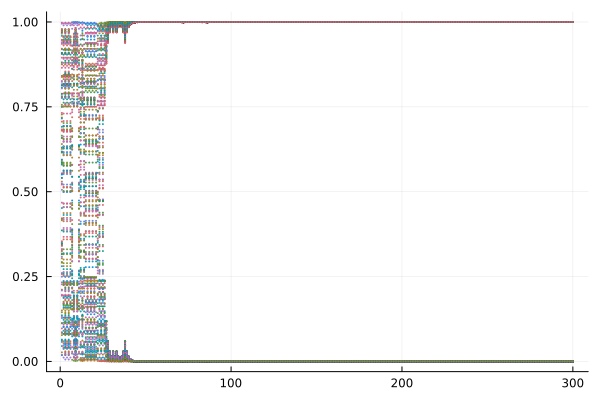

In [246]:
Plots.plot(trajectories, seriestype=:scatter, legend=:none, markersize=1, markerstrokewidth=0)